In [1]:
import torch

print("GPU available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

GPU available: True
GPU: Tesla T4


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import os
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import time

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

from torchvision import transforms
from torchvision.models import vit_b_16

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [4]:
class PCOSDataset(Dataset):

    def __init__(self, root_dir, transform=None):

        self.transform = transform
        self.samples = []

        classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls:i for i,cls in enumerate(classes)}

        for cls in classes:
            cls_path=os.path.join(root_dir,cls)

            for img_path in glob(os.path.join(cls_path,"*")):
                self.samples.append((img_path,self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self,idx):

        img_path,label=self.samples[idx]

        img=Image.open(img_path).convert("RGB")

        if self.transform:
            img=self.transform(img)

        return img,label

In [5]:
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

In [6]:
DATA_PATH="/content/drive/MyDrive/DL_Project_Code/PCOS"

dataset=PCOSDataset(DATA_PATH,transform)

print("Total images:",len(dataset))
print("Classes:",dataset.class_to_idx)

Total images: 11784
Classes: {'infected': 0, 'noninfected': 1}


In [7]:
labels=[s[1] for s in dataset.samples]
indices=list(range(len(dataset)))

train_idx,temp_idx=train_test_split(
    indices,
    test_size=0.3,
    stratify=labels,
    random_state=42
)

temp_labels=[labels[i] for i in temp_idx]

val_idx,test_idx=train_test_split(
    temp_idx,
    test_size=0.5,
    stratify=temp_labels,
    random_state=42
)

train_dataset=torch.utils.data.Subset(dataset,train_idx)
val_dataset=torch.utils.data.Subset(dataset,val_idx)
test_dataset=torch.utils.data.Subset(dataset,test_idx)

print("Train:",len(train_dataset))
print("Validation:",len(val_dataset))
print("Test:",len(test_dataset))

Train: 8248
Validation: 1768
Test: 1768


In [8]:
train_loader=DataLoader(train_dataset,batch_size=32,shuffle=True,num_workers=4,pin_memory=True)
val_loader=DataLoader(val_dataset,batch_size=32,shuffle=False,num_workers=4,pin_memory=True)
test_loader=DataLoader(test_dataset,batch_size=32,shuffle=False,num_workers=4,pin_memory=True)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


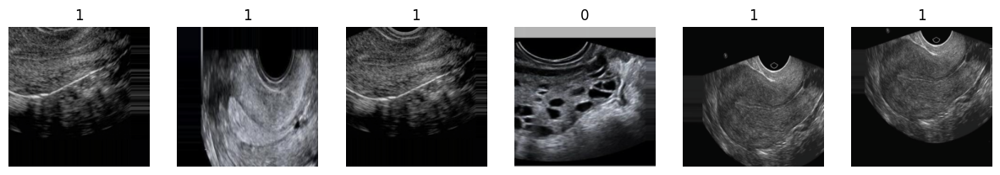

In [11]:
def unnormalize(img):

    mean=np.array([0.485,0.456,0.406])
    std=np.array([0.229,0.224,0.225])

    img=img.permute(1,2,0).cpu().numpy()
    img=std*img+mean

    return np.clip(img,0,1)


def show_batch(loader,n=6):

    imgs,labels=next(iter(loader))

    plt.figure(figsize=(15,4))

    for i in range(n):

        plt.subplot(1,n,i+1)
        plt.imshow(unnormalize(imgs[i]))
        plt.title(labels[i].item())
        plt.axis("off")

    plt.show()

show_batch(train_loader)

In [12]:
num_classes=len(dataset.class_to_idx)

def build_model():

    model=vit_b_16(weights="IMAGENET1K_V1")

    model.heads.head=nn.Linear(
        model.heads.head.in_features,
        num_classes
    )

    return model

In [13]:
def load_checkpoint(model, optimizer, path, device):

    checkpoint = torch.load(path, map_location=device)

    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

    start_epoch = checkpoint['epoch'] + 1
    best_val_acc = checkpoint['best_val_acc']

    print("Checkpoint loaded")
    print("Resuming from epoch:", start_epoch)

    return model, optimizer, start_epoch, best_val_acc

In [14]:
def train_model(model, train_loader, val_loader, lr, epochs=5, patience=3):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    best_val_acc = 0
    patience_counter = 0
    start_epoch = 0

    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": []
    }

    best_checkpoint_path = f"/content/drive/MyDrive/DL_Project_Code/best_checkpoint_lr_{lr}.pth"
    latest_checkpoint_path = f"/content/drive/MyDrive/DL_Project_Code/latest_checkpoint_lr_{lr}.pth"


    if os.path.exists(latest_checkpoint_path):

        print("\nLatest checkpoint found. Loading previous training state\n")

        checkpoint = torch.load(latest_checkpoint_path, map_location=device)

        model.load_state_dict(checkpoint["model_state_dict"])
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])

        start_epoch = checkpoint["epoch"]
        best_val_acc = checkpoint["best_val_acc"]
        patience_counter = checkpoint.get("patience_counter", 0)
        history = checkpoint.get("history", history)

        print("-------------------------------")
        print("Previous Training Summary")
        print("-------------------------------")

        for i in range(len(history["train_acc"])):
            print(
                f"Epoch {i+1} | "
                f"Train Loss: {history['train_loss'][i]:.4f} | "
                f"Train Acc: {history['train_acc'][i]:.4f} | "
                f"Val Loss: {history['val_loss'][i]:.4f} | "
                f"Val Acc: {history['val_acc'][i]:.4f}"
            )

        print("-------------------------------")

        if start_epoch >= epochs:
            print(f"Training already completed for LR = {lr}")
            print(f"Best Validation Accuracy: {best_val_acc:.4f}")
            return best_val_acc

        print(f"Resuming from Epoch {start_epoch + 1}")
        print(f"Best Validation Accuracy so far: {best_val_acc:.4f}\n")

    for epoch in range(start_epoch, epochs):

        print("\n------------------------------")
        print(f"Epoch {epoch + 1}/{epochs}")
        print("--------------------------------")

        start = time.time()

        model.train()

        train_preds = []
        train_labels = []
        train_loss = 0

        for imgs, labels in train_loader:

            imgs = imgs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad()

            outputs = model(imgs)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            train_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)

            train_preds.extend(preds.cpu().numpy())
            train_labels.extend(labels.cpu().numpy())

        train_loss /= len(train_loader)
        train_acc = accuracy_score(train_labels, train_preds)

        model.eval()

        val_preds = []
        val_labels = []
        val_loss = 0

        with torch.no_grad():

            for imgs, labels in val_loader:

                imgs = imgs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)

                outputs = model(imgs)
                loss = criterion(outputs, labels)

                val_loss += loss.item()

                preds = torch.argmax(outputs, dim=1)

                val_preds.extend(preds.cpu().numpy())
                val_labels.extend(labels.cpu().numpy())

        val_loss /= len(val_loader)
        val_acc = accuracy_score(val_labels, val_preds)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        print(f"Train Loss: {train_loss:.4f}")
        print(f"Train Accuracy: {train_acc:.4f}")
        print(f"Validation Loss: {val_loss:.4f}")
        print(f"Validation Accuracy: {val_acc:.4f}")

        if val_acc > best_val_acc:

            best_val_acc = val_acc
            patience_counter = 0

            torch.save({
                "epoch": epoch + 1,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "best_val_acc": best_val_acc,
                "history": history,
                "lr": lr
            }, best_checkpoint_path)

            print("Best checkpoint saved")

        else:
            patience_counter += 1


        torch.save({
            "epoch": epoch + 1,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "best_val_acc": best_val_acc,
            "patience_counter": patience_counter,
            "history": history,
            "lr": lr
        }, latest_checkpoint_path)

        print("Latest checkpoint saved")
        print("Epoch Time:", round(time.time() - start, 2), "seconds")

        if patience_counter >= patience:
            print("Early stopping triggered")
            break

    return best_val_acc

In [15]:
learning_rates=[1e-4,3e-5,1e-5]

best_acc=0
best_lr=None

for lr in learning_rates:

    print("\n---------------------------")
    print("Training with LR =",lr)
    print("-----------------------------")

    model=build_model()

    val_acc=train_model(model,train_loader,val_loader,lr)

    if val_acc>best_acc:

        best_acc=val_acc
        best_lr=lr

print("\nBest Learning Rate:",best_lr)
print("Best Validation Accuracy:",best_acc)


---------------------------
Training with LR = 0.0001
-----------------------------

Latest checkpoint found. Loading previous training state

-------------------------------
Previous Training Summary
-------------------------------
Epoch 1 | Train Loss: 0.1123 | Train Acc: 0.9508 | Val Loss: 0.0376 | Val Acc: 0.9864
Epoch 2 | Train Loss: 0.0508 | Train Acc: 0.9831 | Val Loss: 0.0554 | Val Acc: 0.9791
Epoch 3 | Train Loss: 0.0423 | Train Acc: 0.9878 | Val Loss: 0.0244 | Val Acc: 0.9938
Epoch 4 | Train Loss: 0.0340 | Train Acc: 0.9901 | Val Loss: 0.0969 | Val Acc: 0.9632
Epoch 5 | Train Loss: 0.0359 | Train Acc: 0.9880 | Val Loss: 0.0380 | Val Acc: 0.9876
-------------------------------
Training already completed for LR = 0.0001
Best Validation Accuracy: 0.9938

---------------------------
Training with LR = 3e-05
-----------------------------

Latest checkpoint found. Loading previous training state

-------------------------------
Previous Training Summary
---------------------------

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = build_model()

checkpoint = torch.load(
    f"/content/drive/MyDrive/DL_Project_Code/best_checkpoint_lr_{best_lr}.pth",
    map_location=device
)

model.load_state_dict(checkpoint["model_state_dict"])

model = model.to(device)
model.eval()

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [17]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

def evaluate_model(model, test_loader):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    preds = []
    labels_list = []

    wrong_images = []
    wrong_preds = []
    wrong_labels = []

    model.eval()

    with torch.no_grad():

        for imgs, labels in test_loader:

            imgs = imgs.to(device, non_blocking=True)

            outputs = model(imgs)

            predicted = torch.argmax(outputs, 1)

            preds.extend(predicted.cpu().numpy())
            labels_list.extend(labels.numpy())


            for i in range(len(predicted)):

                if predicted[i] != labels[i].to(device):

                    wrong_images.append(imgs[i].cpu())
                    wrong_preds.append(predicted[i].cpu().item())
                    wrong_labels.append(labels[i].item())


    acc = accuracy_score(labels_list, preds)

    precision = precision_score(labels_list, preds, average="weighted")
    recall = recall_score(labels_list, preds, average="weighted")
    f1 = f1_score(labels_list, preds, average="weighted")

    cm = confusion_matrix(labels_list, preds)

    print("\n================ TEST RESULTS ================")

    print("Accuracy :", acc)
    print("Precision:", precision)
    print("Recall   :", recall)
    print("F1 Score :", f1)

    print("\nConfusion Matrix")
    print(cm)


    label_map = {
        0: "Infected",
        1: "Not Infected"
    }



    print("\nTotal Misclassified Images:", len(wrong_images))

    if len(wrong_images) > 0:

        cols = 4
        rows = int(np.ceil(len(wrong_images) / cols))

        plt.figure(figsize=(10, 5 * rows))

        for i in range(len(wrong_images)):

            img = wrong_images[i]


            if img.shape[0] == 3:
                img = img.mean(dim=0)

            img = img.numpy()

            plt.subplot(rows, cols, i + 1)
            plt.imshow(img, cmap="gray")
            plt.axis("off")

            true_label = label_map[wrong_labels[i]]
            pred_label = label_map[wrong_preds[i]]

            plt.title(f"True: {true_label}\nPred: {pred_label}")

        plt.tight_layout()
        plt.show()


================ TEST RESULTS ================
Accuracy : 0.996606334841629
Precision: 0.996619106575658
Recall   : 0.996606334841629
F1 Score : 0.9966075074726205

Confusion Matrix
[[1013    5]
 [   1  749]]

Total Misclassified Images: 6


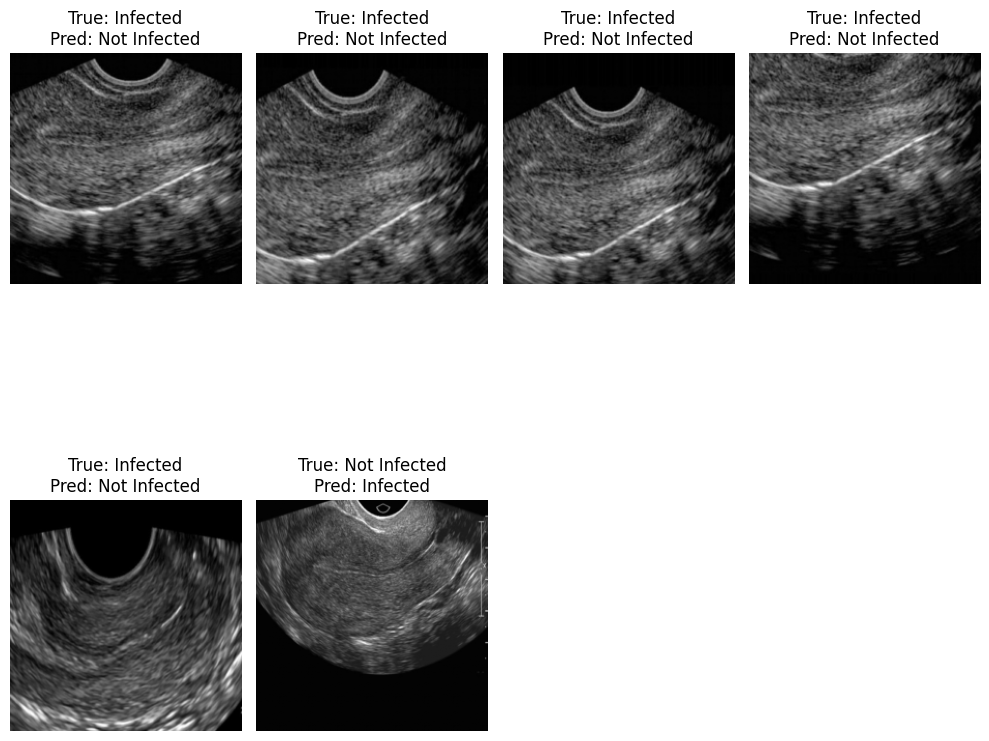

In [18]:
evaluate_model(model,test_loader)

Explainability
---

(1) Attention Heatmaps using GradCAM
---

In [19]:
!pip install grad-cam

In [20]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = model.to(device)
model.eval()

idx_to_class = {v: k for k, v in dataset.class_to_idx.items()}
print(idx_to_class)

{0: 'infected', 1: 'noninfected'}


In [22]:
def reshape_transform(tensor):

    tensor = tensor[:, 1:, :]

    result = tensor.reshape(tensor.size(0), 14, 14, tensor.size(2))

    result = result.permute(0, 3, 1, 2)

    return result

In [68]:
def vit_gradcam_explanation(model, image_path, target_class=None, show=True):

    img = Image.open(image_path).convert("RGB")
    img_resized = img.resize((224, 224))

    rgb_img = np.array(img_resized).astype(np.float32) / 255.0

    input_tensor = transform(img).unsqueeze(0).to(device)

    output = model(input_tensor)
    probs = F.softmax(output, dim=1)[0]

    predicted_class = torch.argmax(probs).item()

    if target_class is None:
        target_class = 1 - predicted_class

    target_layers = [model.encoder.layers[-1].ln_1]

    cam = GradCAM(
        model=model,
        target_layers=target_layers,
        reshape_transform=reshape_transform
    )

    targets = [ClassifierOutputTarget(target_class)]

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets
    )[0]

    cam_image = show_cam_on_image(
        rgb_img,
        grayscale_cam,
        use_rgb=True
    )

    if show:
        print("\n------------- Class Probabilities --------------")
        for i, prob in enumerate(probs):
            print(f"{idx_to_class[i]}: {prob.item() * 100:.2f}%")

        print("\nGrad-CAM Attention Heatmap")

        plt.figure(figsize=(10, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(rgb_img)
        plt.title("Original Ultrasound")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(grayscale_cam, cmap="jet")
        plt.title("Grad-CAM Heatmap")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(cam_image)
        plt.title("Grad-CAM Overlay")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    return grayscale_cam, cam_image, probs

In [69]:
image1_path = "/content/drive/MyDrive/DL_Project_Code/PCOS/infected/Image_080.jpg"
image2_path = "/content/drive/MyDrive/DL_Project_Code/PCOS/infected/Image_003.jpg"
image3_path = "/content/drive/MyDrive/DL_Project_Code/PCOS/infected/Image_324.jpg"
image4_path = "/content/drive/MyDrive/DL_Project_Code/PCOS/infected/Image_079.jpg"
image5_path = "/content/drive/MyDrive/DL_Project_Code/PCOS/infected/Image_005.jpg"
image6_path = "/content/drive/MyDrive/DL_Project_Code/PCOS/infected/Image_019.jpg"
image6_path = "/content/drive/MyDrive/DL_Project_Code/PCOS/infected/Image_019.jpg"
image7_path = "/content/drive/MyDrive/DL_Project_Code/PCOS/infected/Image_143.jpg"
image8_path = "/content/drive/MyDrive/DL_Project_Code/PCOS/infected/Image_171.jpg"


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%

Grad-CAM Attention Heatmap


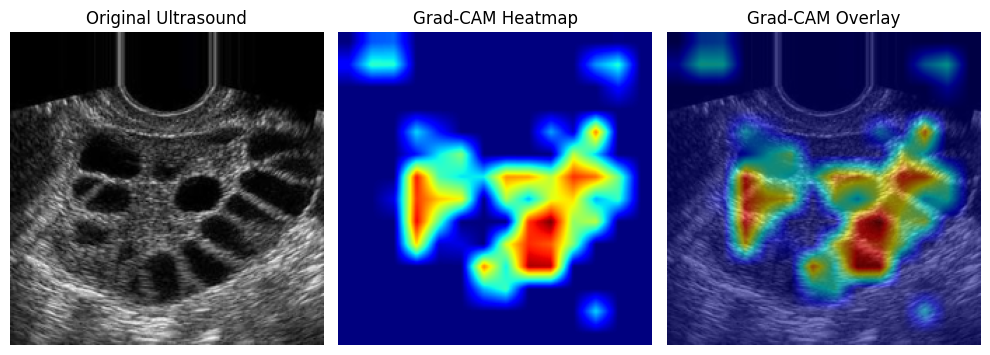


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%

Grad-CAM Attention Heatmap


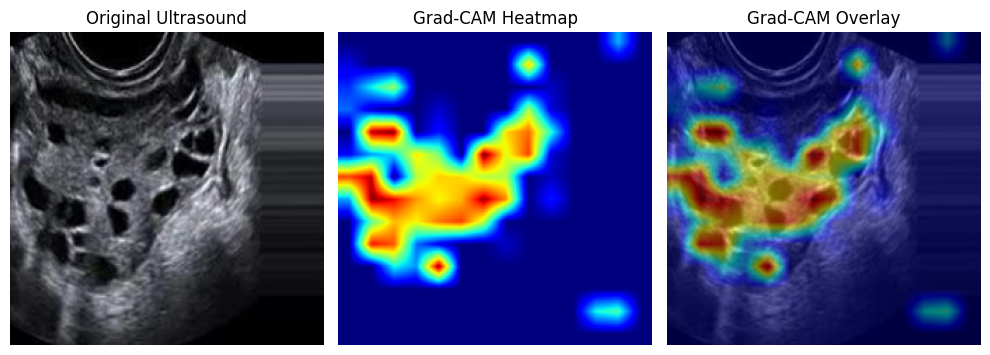


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%

Grad-CAM Attention Heatmap


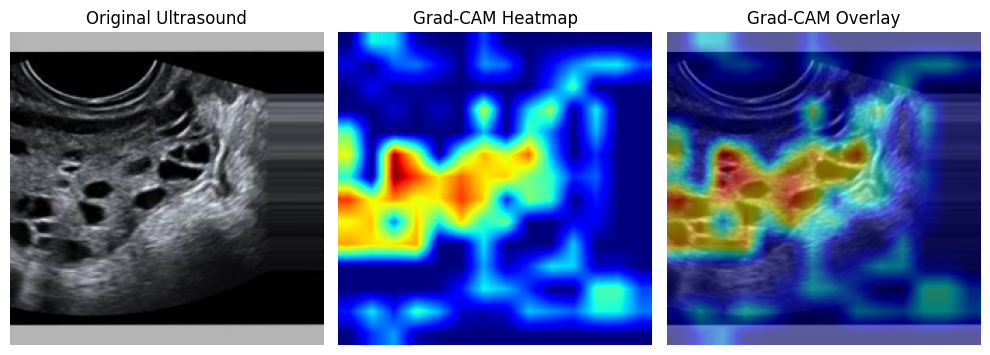


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%

Grad-CAM Attention Heatmap


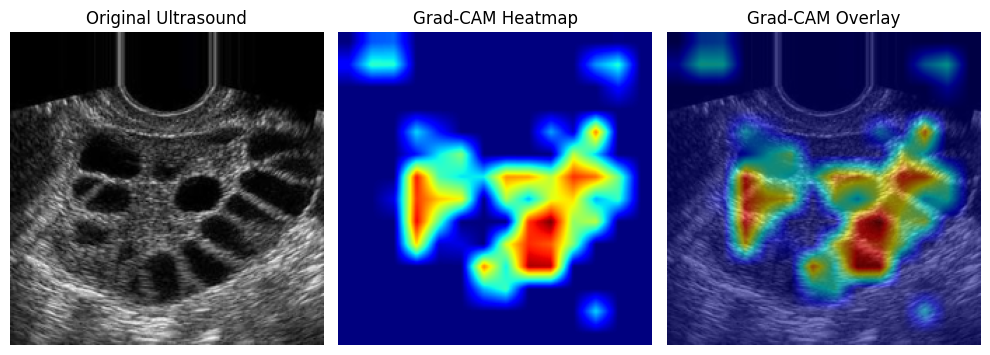


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%

Grad-CAM Attention Heatmap


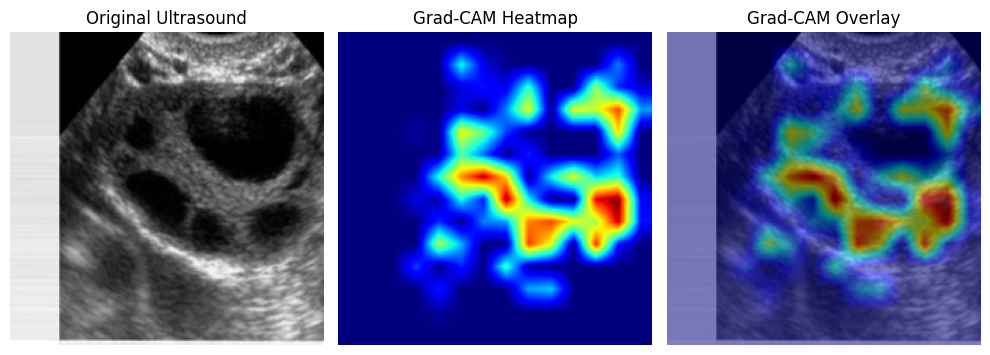


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%

Grad-CAM Attention Heatmap


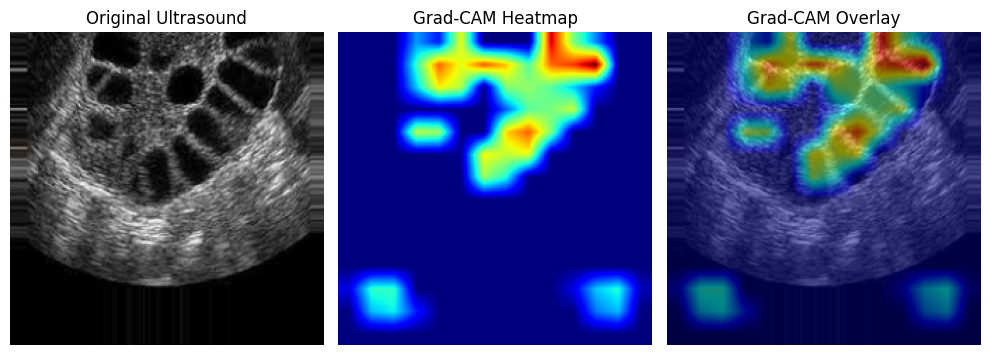


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%

Grad-CAM Attention Heatmap


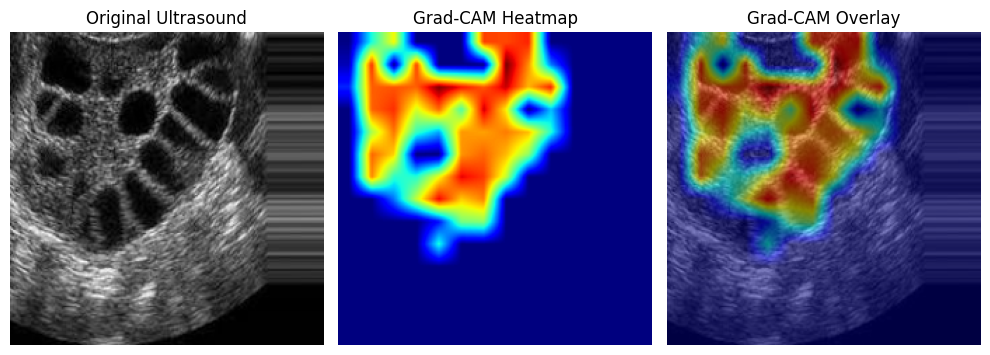


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%

Grad-CAM Attention Heatmap


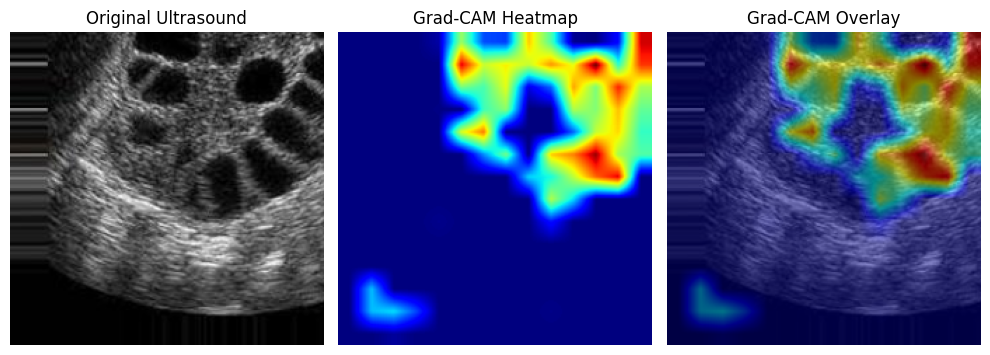

In [70]:
for path1 in [
    image1_path, image2_path, image3_path,
    image4_path, image5_path, image6_path,
    image7_path, image8_path
]:
    heatmap, cam_image, _ = vit_gradcam_explanation(model, path1)

(2) Follicle Segmentation using GradCAM + MedSAM
---


In [63]:
!pip install git+https://github.com/facebookresearch/segment-anything.git

!wget -O medsam_vit_b.pth https://zenodo.org/records/10689643/files/medsam_vit_b.pth

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-mfj4tghz
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-mfj4tghz
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
--2026-05-01 14:33:53--  https://zenodo.org/records/10689643/files/medsam_vit_b.pth
Resolving zenodo.org (zenodo.org)... 137.138.52.235, 188.184.103.118, 137.138.153.219, ...
Connecting to zenodo.org (zenodo.org)|137.138.52.235|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375049145 (358M) [application/octet-stream]
Saving to: ‘medsam_vit_b.pth’

medsam_vit_b.pth    100%[===================>] 357.67M  12.2MB/s    in 30s     

2026-05-01 14:34:24 (11.8 MB/s) - ‘medsam_vit_b.pth’ saved [375049145/375049145]



In [34]:
from segment_anything import sam_model_registry, SamPredictor

medsam = sam_model_registry["vit_b"](checkpoint="medsam_vit_b.pth")
medsam.to(device)
medsam.eval()

predictor = SamPredictor(medsam)

print("MedSAM loaded")

MedSAM loaded


In [144]:
def gradcam_to_prompts(heatmap, threshold=0.6, top_k=15):

    binary = heatmap > threshold
    coords = np.argwhere(binary)

    if len(coords) == 0:
        return np.array([20, 20, 204, 204]), None, None

    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)

    box = np.array([x_min, y_min, x_max, y_max])

    flat = heatmap.flatten()
    top_indices = np.argsort(flat)[-top_k:]

    points = []
    for idx in top_indices:
        y, x = np.unravel_index(idx, heatmap.shape)
        points.append([x, y])

    points = np.array(points)
    labels = np.ones(len(points))

    return box, points, labels

In [145]:
def segment_follicles_with_gradcam(model, image_path):

    heatmap, cam_image, probs = vit_gradcam_explanation(
        model,
        image_path,
        show=False
    )

    img = Image.open(image_path).convert("RGB")
    img_resized = img.resize((224, 224))
    image_np = np.array(img_resized)

    box, points, labels = gradcam_to_prompts(
        heatmap,
        threshold=0.6,
        top_k=15
    )

    predictor.set_image(image_np)

    masks, scores, _ = predictor.predict(
        point_coords=points,
        point_labels=labels,
        box=box,
        multimask_output=True
    )

    best_idx = np.argmax(scores)
    best_mask = masks[best_idx]

    purple_overlay = np.zeros_like(image_np)
    purple_overlay[:, :, 0] = 128
    purple_overlay[:, :, 2] = 128

    alpha = 0.5

    result = image_np.copy()
    result[best_mask] = (
        (1 - alpha) * result[best_mask] +
        alpha * purple_overlay[best_mask]
    ).astype(np.uint8)

    print("\n------------- Class Probabilities --------------")
    for i, prob in enumerate(probs):
        print(f"{idx_to_class[i]}: {prob.item() * 100:.2f}%")

    plt.figure(figsize=(10, 6))

    plt.subplot(2, 3, 1)
    plt.imshow(image_np)
    plt.title("Original Ultrasound")
    plt.axis("off")

    plt.subplot(2, 3, 2)
    plt.imshow(heatmap, cmap="jet")
    plt.title("Grad-CAM Heatmap")
    plt.axis("off")

    plt.subplot(2, 3, 3)
    plt.imshow(cam_image)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")

    plt.subplot(2, 3, 4)
    plt.imshow(image_np)
    plt.imshow(heatmap, cmap="jet", alpha=0.45)


    x1, y1, x2, y2 = box
    plt.gca().add_patch(
        plt.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            edgecolor="yellow",
            facecolor="none",
            linewidth=2
        )
    )

    plt.title("Grad-CAM Prompts")
    plt.axis("off")

    plt.subplot(2, 3, 5)
    plt.imshow(result)
    plt.title("Follicle Segmentation using MedSAM ")
    plt.axis("off")

    plt.subplot(2, 3, 6)
    plt.axis("off")

    plt.tight_layout(pad=1.0)
    plt.show()

    return best_mask


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%


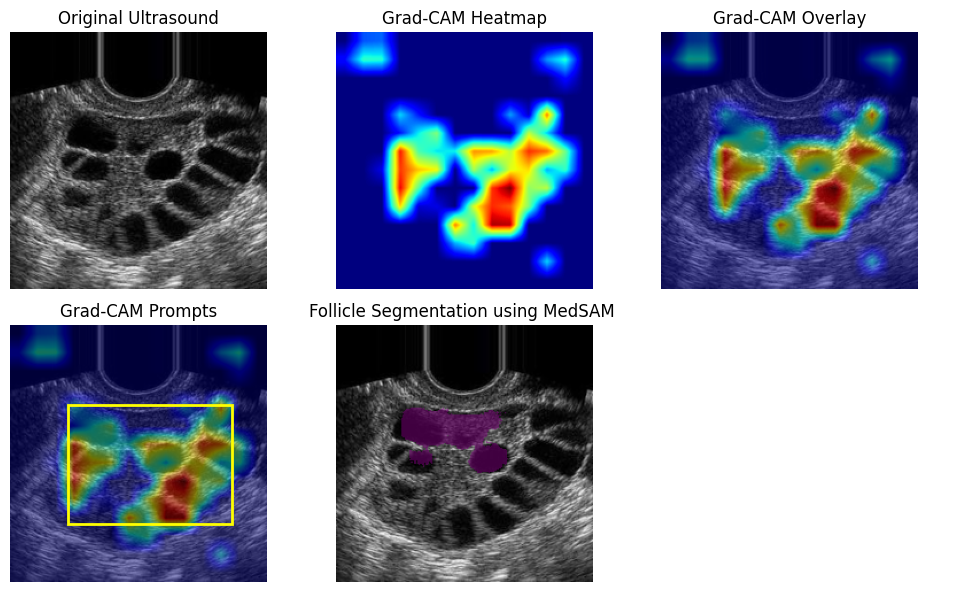


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%


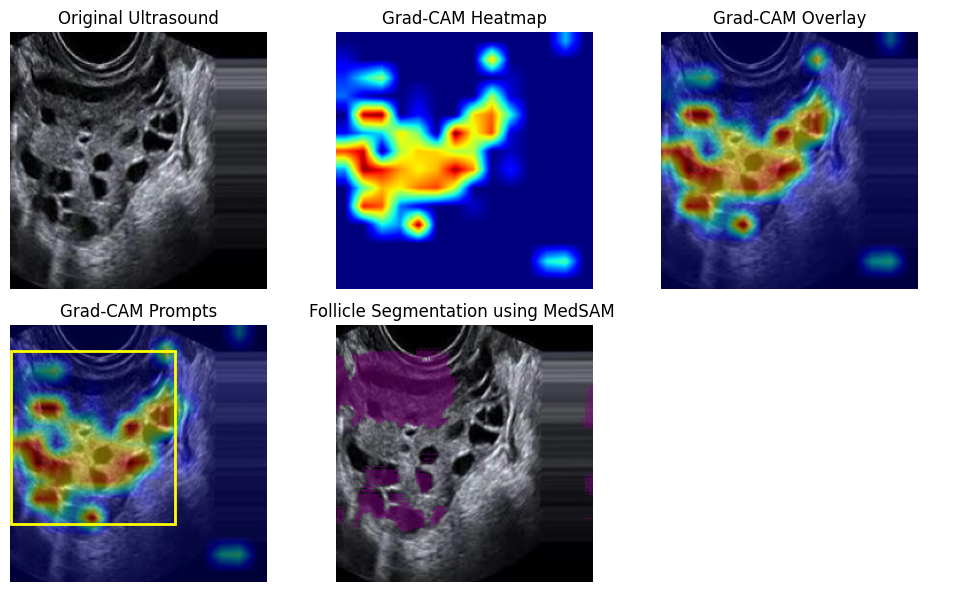


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%


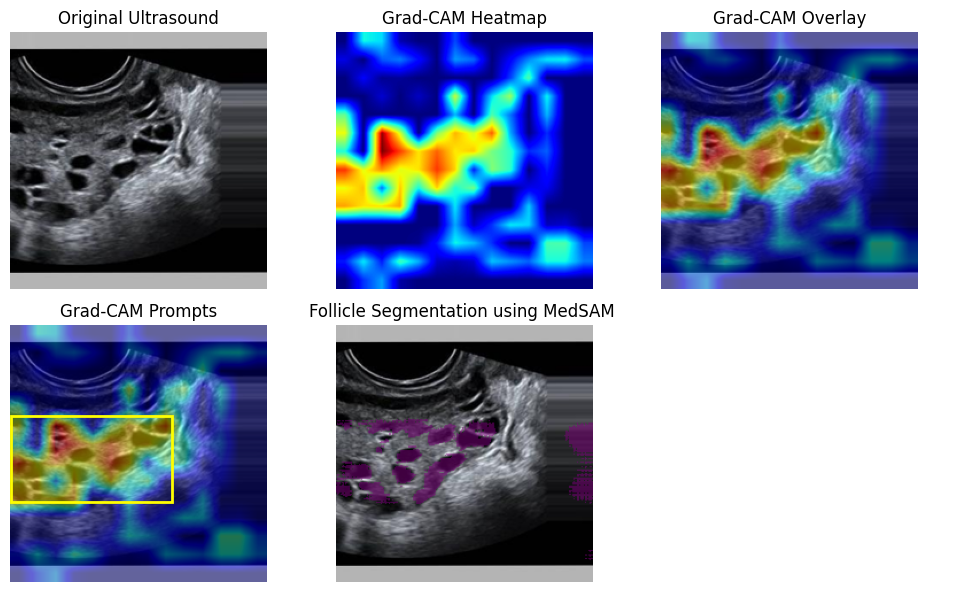


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%


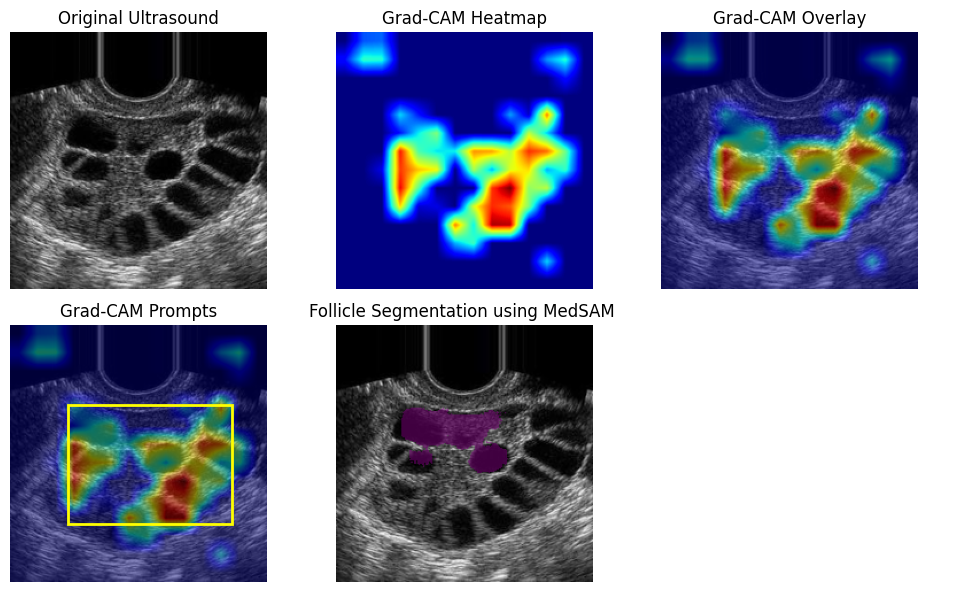


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%


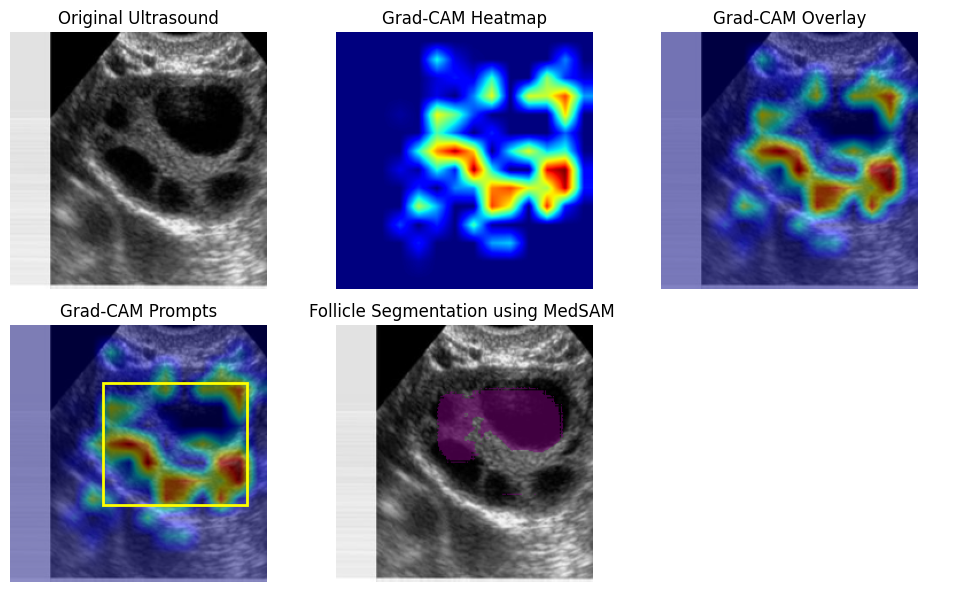


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%


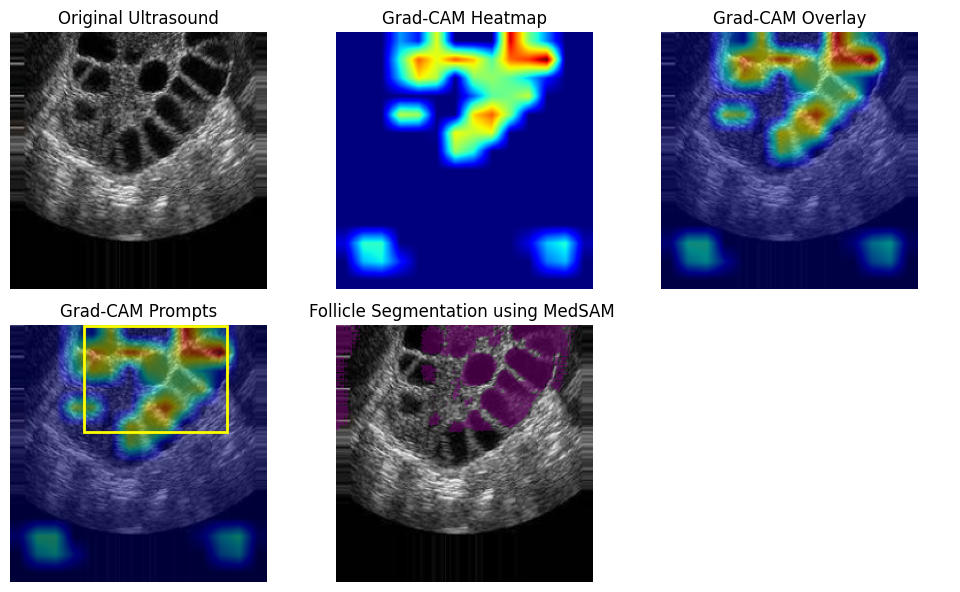


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%


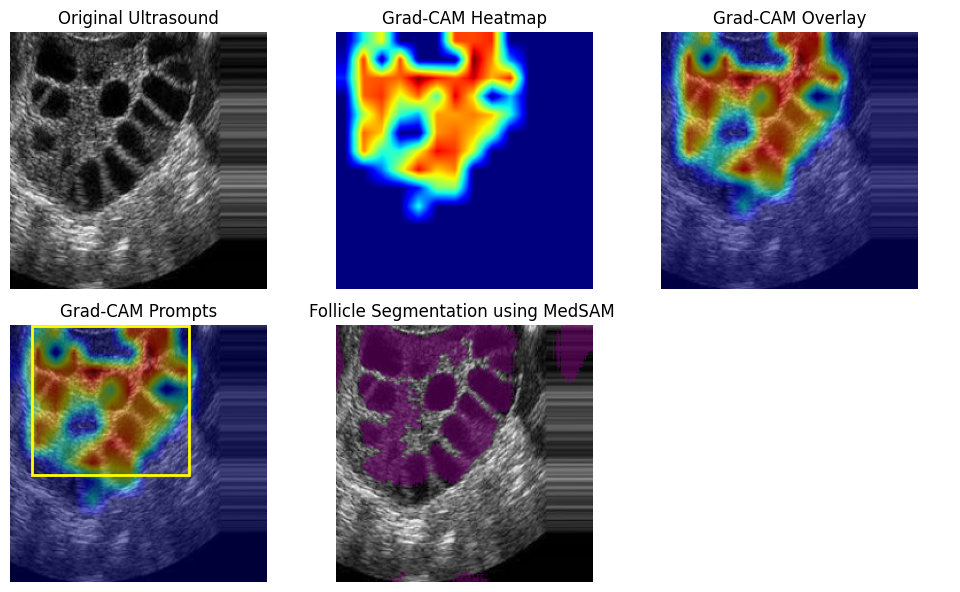


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%


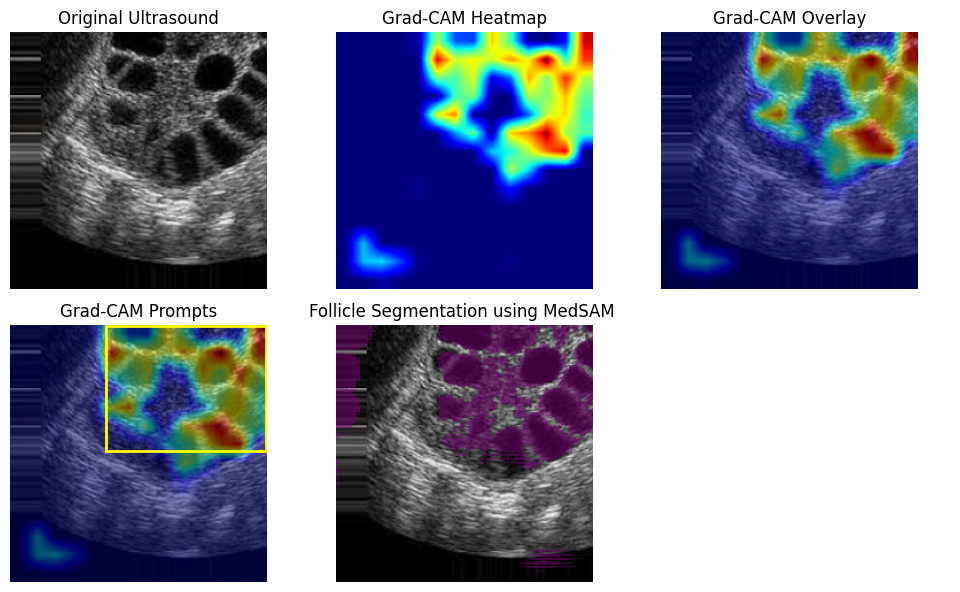

In [117]:
for path in [
    image1_path, image2_path, image3_path,
    image4_path, image5_path, image6_path,
    image7_path, image8_path
]:
    segment_follicles_with_gradcam(model, path)

(3)Follicle Segmentation using Classical Image processing technique
---

In [125]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [113]:
def classical_follicle_segmentation_colored(
    image_path,
    resize_size=(224, 224),
    threshold_value=60,
    min_area=30,
    max_area=700,
    min_circularity=0.25,
    alpha=0.55
):

    img = Image.open(image_path).convert("RGB")
    img = img.resize(resize_size)
    image_np = np.array(img)

    gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)

    blur = cv2.GaussianBlur(gray, (5, 5), 0)

    _, binary = cv2.threshold(
        blur,
        threshold_value,
        255,
        cv2.THRESH_BINARY_INV
    )

    kernel = np.ones((3, 3), np.uint8)

    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(
        binary,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    follicle_mask = np.zeros_like(binary)
    follicle_count = 0

    for cnt in contours:

        area = cv2.contourArea(cnt)

        if area < min_area or area > max_area:
            continue

        perimeter = cv2.arcLength(cnt, True)

        if perimeter == 0:
            continue

        circularity = 4 * np.pi * area / (perimeter * perimeter)

        x, y, w, h = cv2.boundingRect(cnt)
        aspect_ratio = w / (h + 1e-6)

        if circularity > min_circularity and 0.4 < aspect_ratio < 2.5:
            cv2.drawContours(follicle_mask, [cnt], -1, 255, -1)
            follicle_count += 1

    follicle_mask_bool = follicle_mask.astype(bool)

    # Bright magenta color
    magenta_color = np.array([255, 0, 255])   # RGB
    alpha = 0.6

    colored_result = image_np.copy()

    colored_result[follicle_mask_bool] = (
        (1 - alpha) * colored_result[follicle_mask_bool]
        + alpha * magenta_color
    ).astype(np.uint8)


    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image_np)
    plt.title("Original Ultrasound")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(follicle_mask, cmap="gray")
    plt.title("Classical Follicle Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(colored_result)
    plt.title(f"Classical Segmentation\nCount: {follicle_count}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    return follicle_mask_bool, colored_result, follicle_count

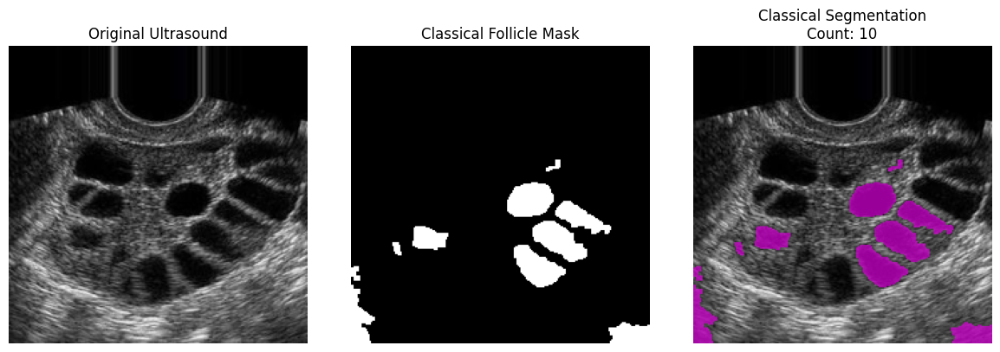

In [114]:
mask, colored_img, count = classical_follicle_segmentation_colored(
    image1_path
)

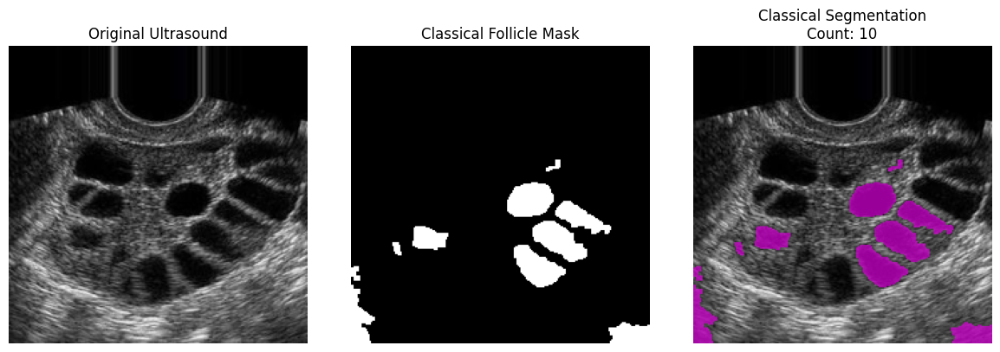

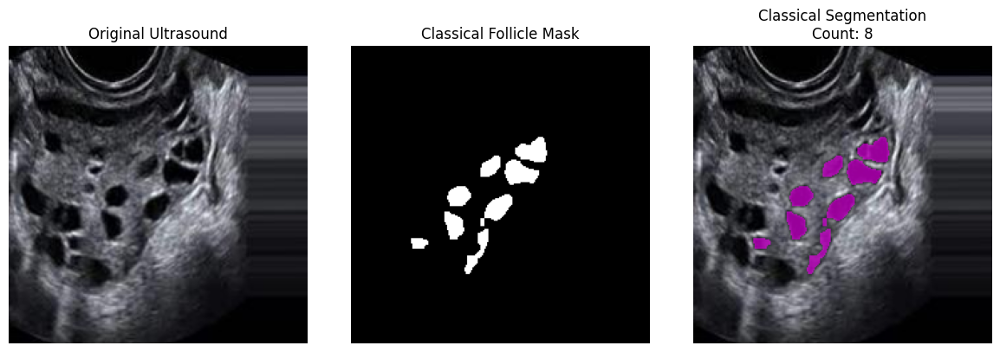

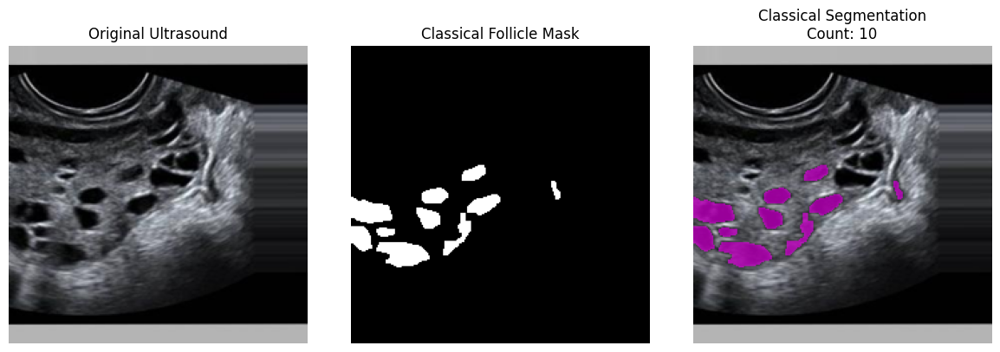

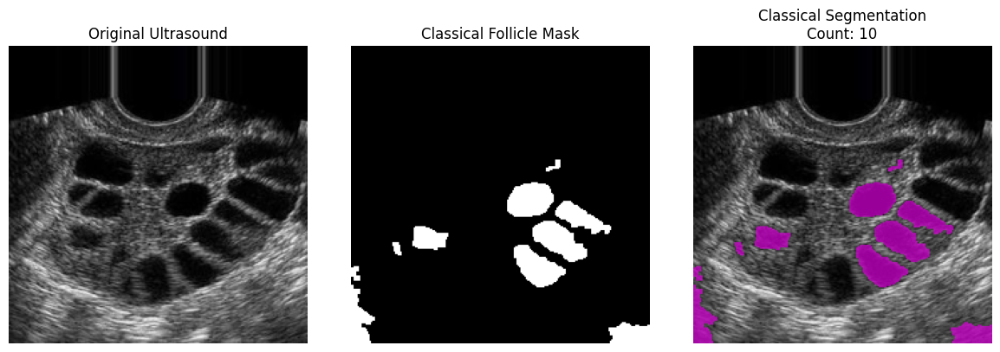

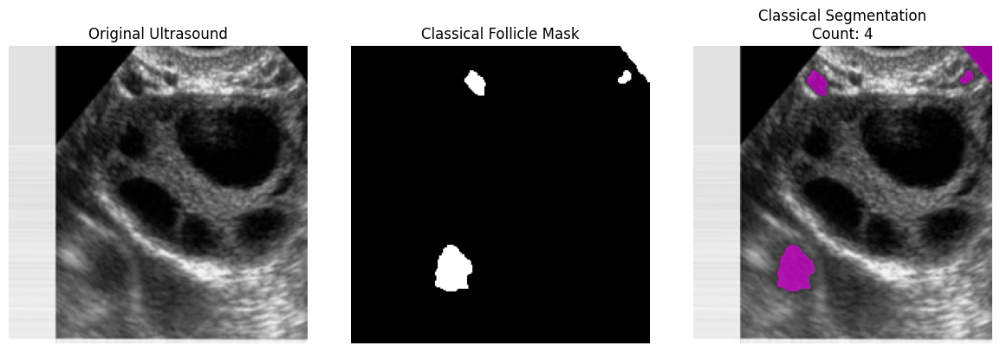

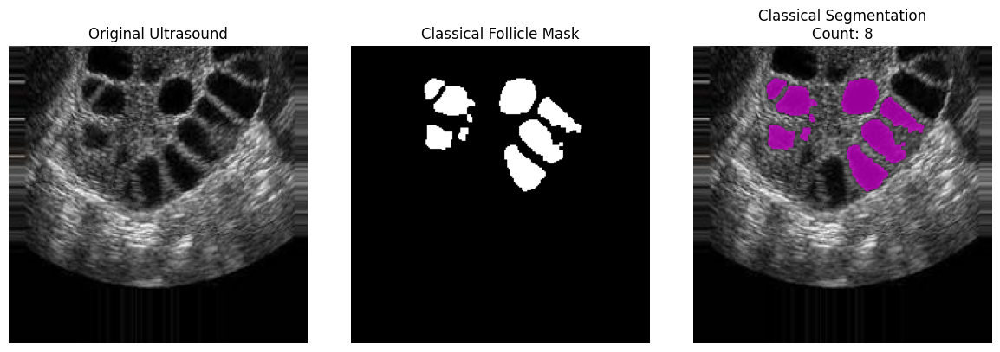

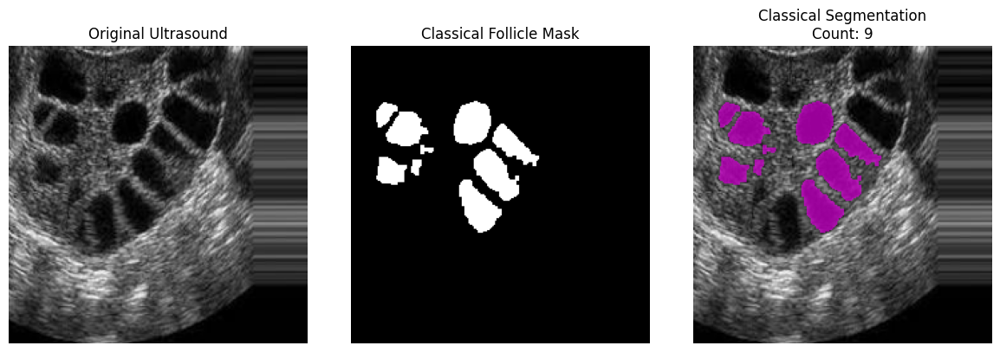

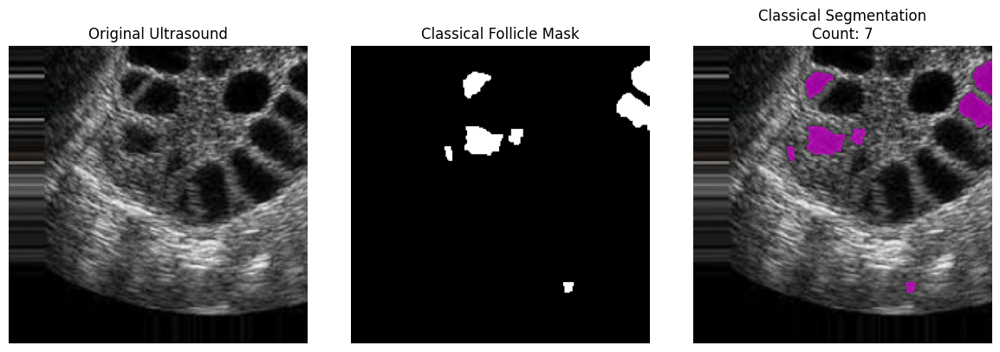

In [115]:
for path in [
    image1_path, image2_path, image3_path,
    image4_path, image5_path, image6_path,
    image7_path, image8_path
]:
    mask, colored_img, count = classical_follicle_segmentation_colored(path)

(4) GradCAM ROI + Classical Follicle segmentation
---

In [149]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [150]:
def improved_gradcam_guided_follicle_segmentation(
    model,
    image_path,
    gradcam_threshold=0.35,
    threshold_value=60,
    min_area=50,
    max_area=3000,
    alpha=0.6
):

    heatmap, cam_image, probs = vit_gradcam_explanation(
        model,
        image_path,
        show=False
    )

    img = Image.open(image_path).convert("RGB")
    img = img.resize((224, 224))
    image_np = np.array(img)

    gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)

    roi_mask = (heatmap > gradcam_threshold).astype(np.uint8) * 255

    kernel_roi = np.ones((9, 9), np.uint8)

    roi_mask = cv2.morphologyEx(
        roi_mask,
        cv2.MORPH_CLOSE,
        kernel_roi
    )

    roi_mask = cv2.dilate(
        roi_mask,
        kernel_roi,
        iterations=1
    )

    roi_mask[:25, :] = 0


    roi_gray = cv2.bitwise_and(gray, gray, mask=roi_mask)

    blur = cv2.GaussianBlur(roi_gray, (7, 7), 0)

    _, thresh = cv2.threshold(
        blur,
        threshold_value,
        255,
        cv2.THRESH_BINARY_INV
    )

    thresh = cv2.bitwise_and(thresh, thresh, mask=roi_mask)

    kernel = np.ones((5, 5), np.uint8)

    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(
        thresh,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    follicle_mask = np.zeros_like(gray)
    follicle_count = 0

    for cnt in contours:

        area = cv2.contourArea(cnt)

        if min_area < area < max_area:

            x, y, w, h = cv2.boundingRect(cnt)

            if y < 25:
                continue

            if x <= 2 or y <= 2 or x + w >= 222 or y + h >= 222:
                continue

            aspect_ratio = w / (h + 1e-6)

            if 0.5 < aspect_ratio < 1.5:

                follicle_count += 1

                cv2.drawContours(
                    follicle_mask,
                    [cnt],
                    -1,
                    255,
                    -1
                )

    follicle_bool = follicle_mask.astype(bool)

    magenta_color = np.array([180, 0, 180])

    result = image_np.copy()

    result[follicle_bool] = (
        (1 - alpha) * result[follicle_bool]
        + alpha * magenta_color
    ).astype(np.uint8)

    enhanced_roi = gray.copy()
    enhanced_roi[roi_mask == 0] = 0

    plt.figure(figsize=(10, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(image_np)
    plt.title("Original Ultrasound")
    plt.axis("off")

    plt.subplot(2, 3, 2)
    plt.imshow(cam_image)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")

    plt.subplot(2, 3, 3)
    plt.imshow(roi_mask, cmap="gray")
    plt.title("Grad-CAM ROI Mask")
    plt.axis("off")

    plt.subplot(2, 3, 4)
    plt.imshow(enhanced_roi, cmap="gray")
    plt.title("Enhanced ROI")
    plt.axis("off")

    plt.subplot(2, 3, 5)
    plt.imshow(follicle_mask, cmap="gray")
    plt.title("Detected Follicle Mask")
    plt.axis("off")

    plt.subplot(2, 3, 6)
    plt.imshow(result)
    plt.title(f"Final Follicle Overlay\nCount: {follicle_count}")
    plt.axis("off")

    plt.tight_layout(pad=1.5)
    plt.show()

    print("\n------------- Class Probabilities --------------")
    for i, prob in enumerate(probs):
        print(f"{idx_to_class[i]}: {prob.item() * 100:.2f}%")

    print("Detected Follicle Count:", follicle_count)

    return {
        "roi_mask": roi_mask,
        "enhanced_roi": enhanced_roi,
        "threshold_mask": thresh,
        "follicle_mask": follicle_mask,
        "segmented_image": result,
        "follicle_count": follicle_count,
        "probabilities": probs.detach().cpu().numpy()
    }


================ IMAGE 1 =================


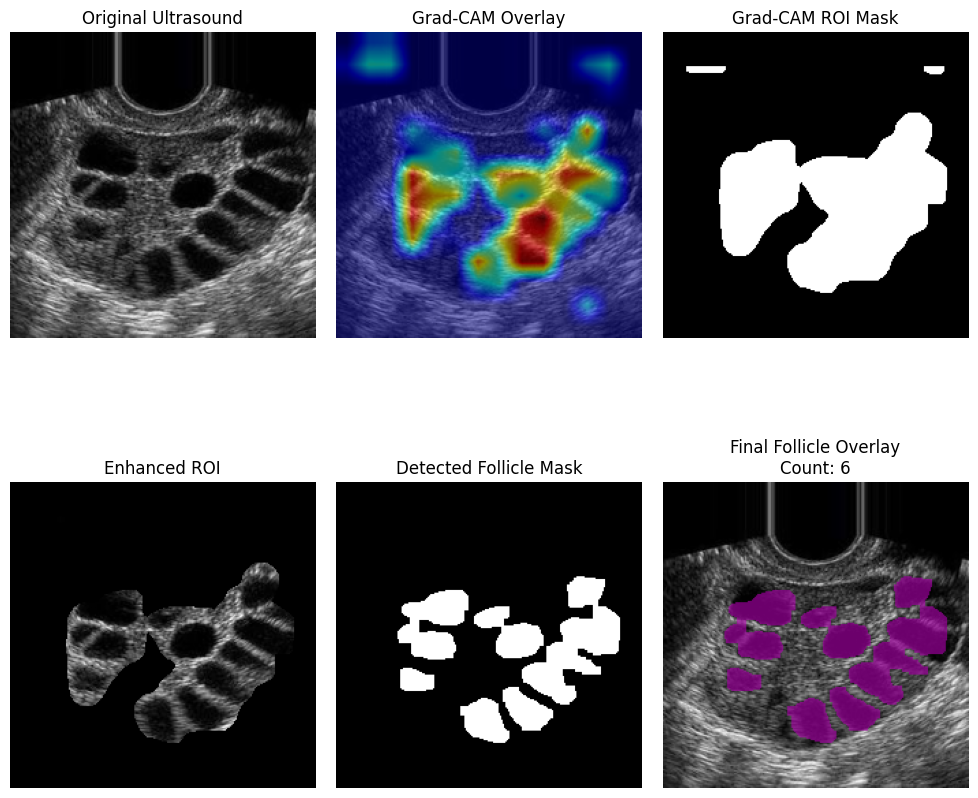


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%
Detected Follicle Count: 6

================ IMAGE 2 =================


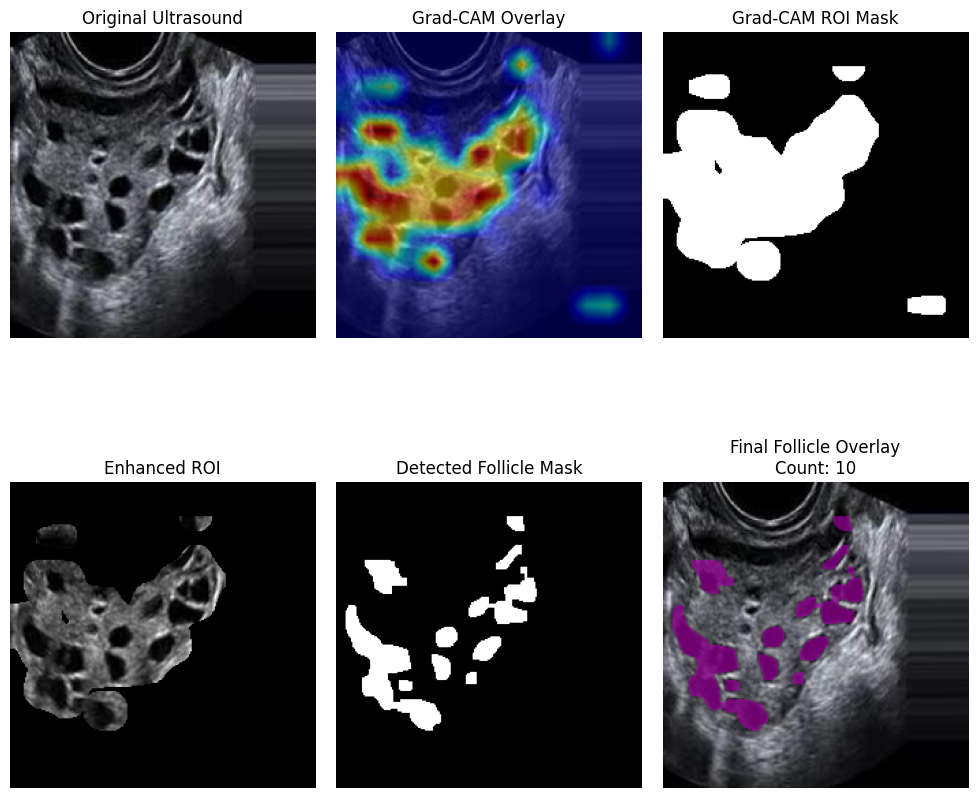


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%
Detected Follicle Count: 10

================ IMAGE 3 =================


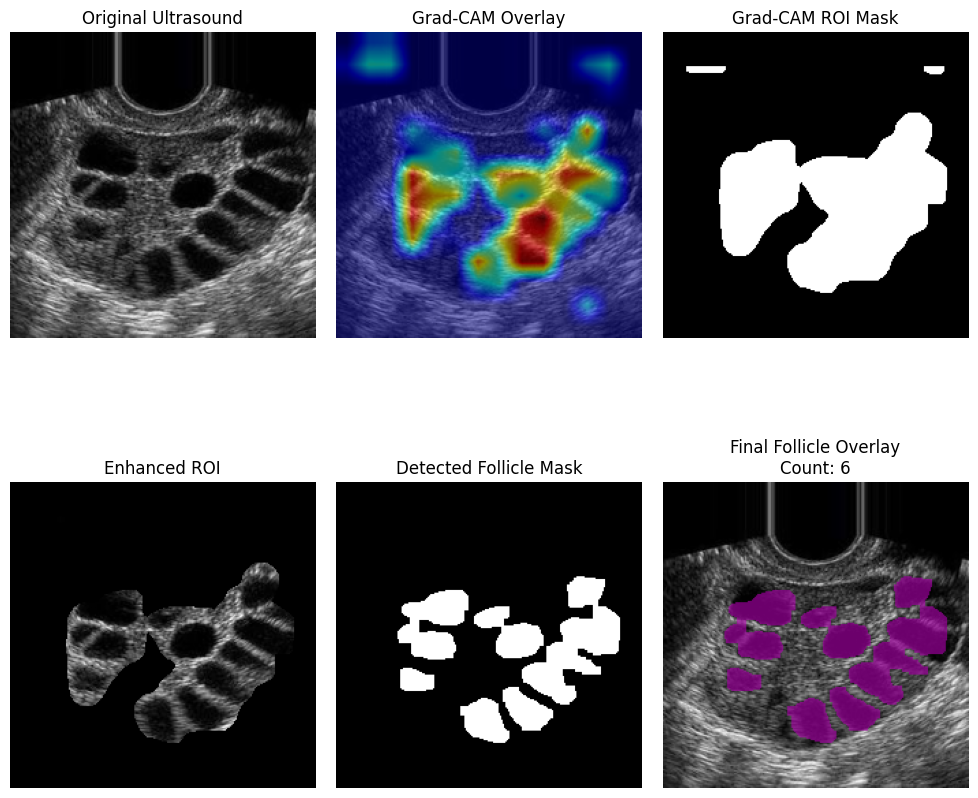


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%
Detected Follicle Count: 6

================ IMAGE 4 =================


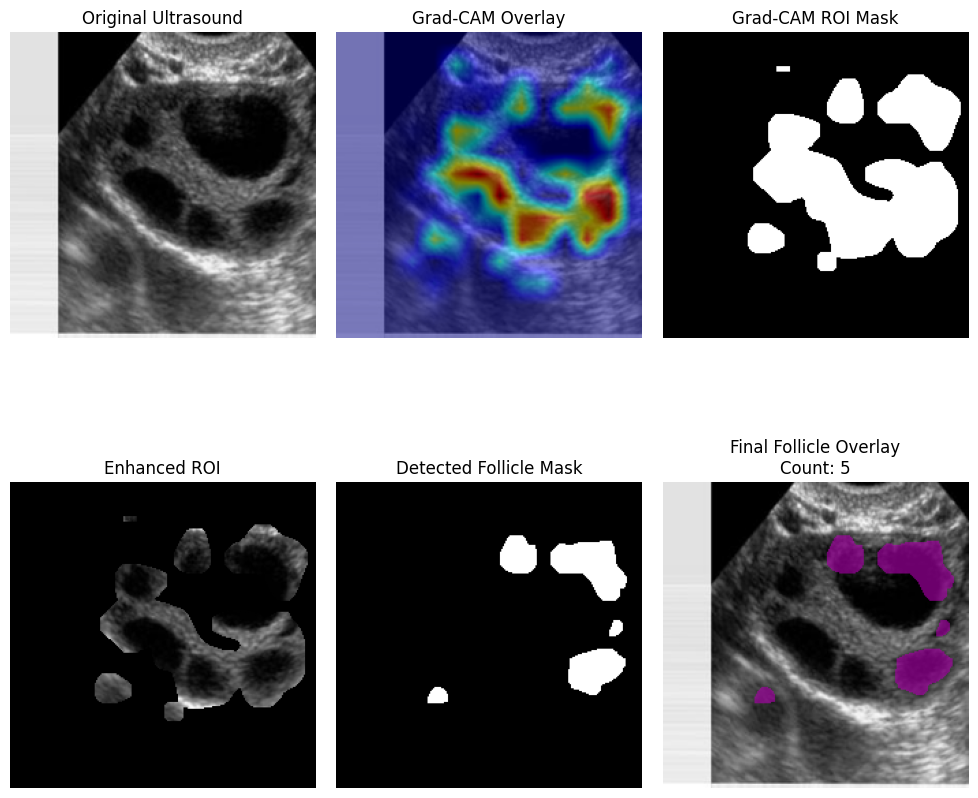


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%
Detected Follicle Count: 5

================ IMAGE 5 =================


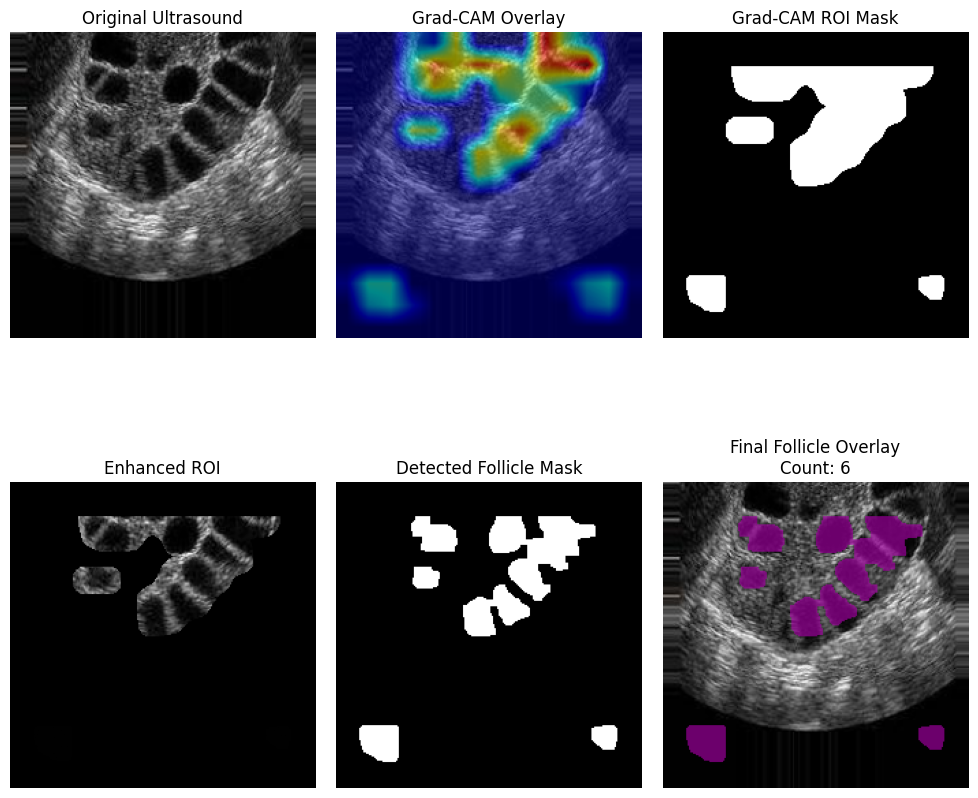


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%
Detected Follicle Count: 6

================ IMAGE 6 =================


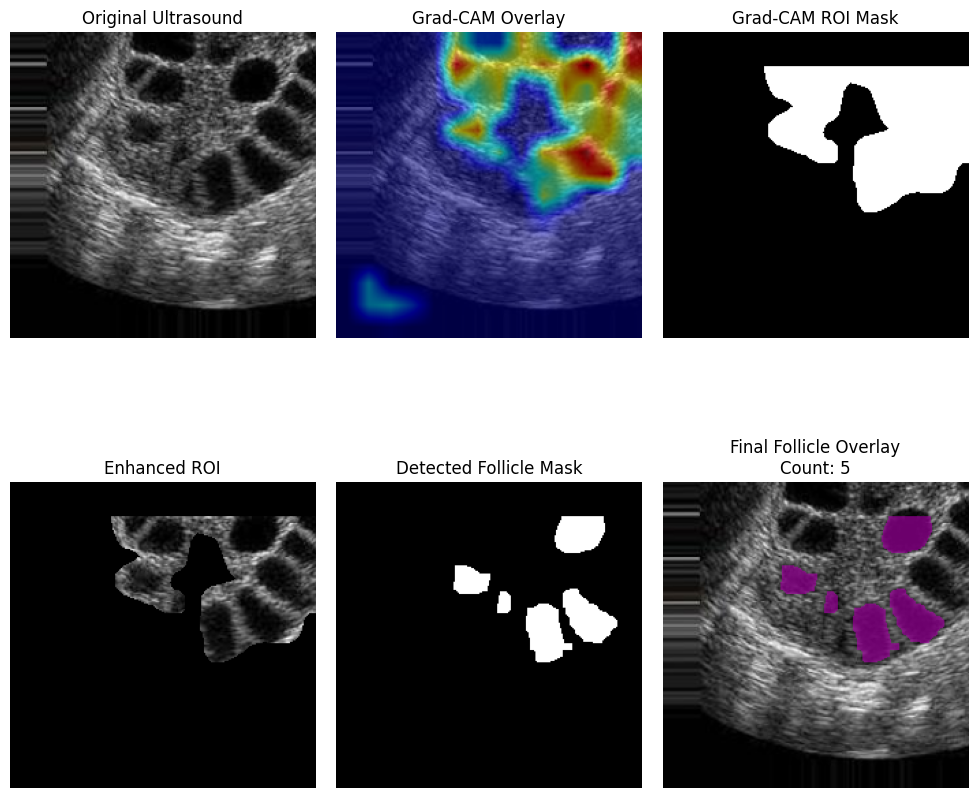


------------- Class Probabilities --------------
infected: 100.00%
noninfected: 0.00%
Detected Follicle Count: 5


In [151]:
image_paths = [
    image1_path, image2_path,
    image4_path, image5_path, image6_path,
     image8_path
]

results = []

for i, path in enumerate(image_paths):

    print(f"\n================ IMAGE {i+1} =================")

    result = improved_gradcam_guided_follicle_segmentation(
        model,
        path,
        gradcam_threshold=0.35,
        threshold_value=60,
        min_area=50,
        max_area=3000
    )

    results.append(result)